In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
filename = 'P:/CoxaAI/preprocess_data/csv_detection_info/AA.csv'
filename_clean = 'P:/CoxaAI/preprocess_data/csv_detection_info_clean/AA.csv'
saved_cropped_image = 'P:/CoxaAI/preprocess_data/cropped/AA'

In [3]:
detection_df = pd.read_csv(filename)

In [4]:
detection_df

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw
0,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.32461.1.20230102.111422.0.2.12316...,1-22050834,1.2.276.0.95.32461.1.20230102.111422.0.2.12316...,838,1039,1288,1433,0.985875,False,0,AA
1,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.32461.1.20230102.111422.0.2.12316...,1-22050834,1.2.276.0.95.32461.1.20230102.111422.0.2.12316...,878,1079,1885,2030,0.947603,False,0,AA
2,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.34467.1.20230105.133125.0.2.1521.dcm,1-22056021,1.2.276.0.95.34467.1.20230105.133125.0.2.1521....,703,879,365,493,0.991792,False,0,AA
3,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.34467.1.20230105.133125.0.2.1521.dcm,1-22056021,1.2.276.0.95.34467.1.20230105.133125.0.2.1521....,700,883,956,1089,0.991147,False,0,AA
4,P:/CoxaAI/Sortering 1/AA,1.3.6.1.4.1.19179.1.1192201227148200105.3.488....,1-22098015,1.3.6.1.4.1.19179.1.1192201227148200105.3.488....,936,1079,650,752,0.996691,False,0,AA
...,...,...,...,...,...,...,...,...,...,...,...,...
197,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.15181.1.20230109.141525.0.2.2576.dcm,1-23002396,1.2.276.0.95.15181.1.20230109.141525.0.2.2576....,1137,1310,1393,1517,0.979398,False,0,AA
198,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.15181.1.20230109.141812.0.2.2584.dcm,1-23002396,1.2.276.0.95.15181.1.20230109.141812.0.2.2584....,1150,1328,732,859,0.996475,False,0,AA
199,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.15181.1.20230109.141812.0.2.2584.dcm,1-23002396,1.2.276.0.95.15181.1.20230109.141812.0.2.2584....,1175,1343,1281,1402,0.993482,False,0,AA
200,P:/CoxaAI/Sortering 1/AA,1.3.51.0.7.1193949500.64187.65096.46831.22406....,1-23002404,1.3.51.0.7.1193949500.64187.65096.46831.22406....,887,1061,600,725,0.976905,False,0,AA


### [Optional] Sort by confidence (filter out bad prediction)

In [5]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [6]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([122, 123], dtype='int64')

Note that there two cases that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [7]:
# plot every 9 of them

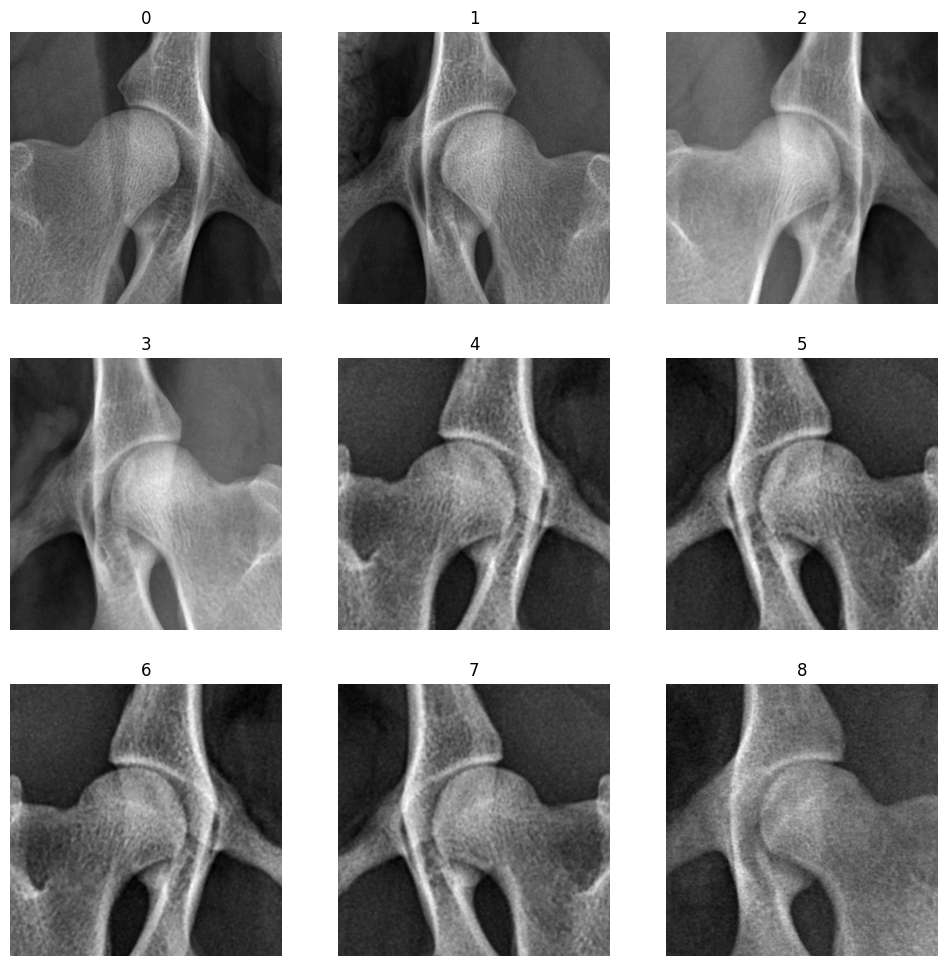

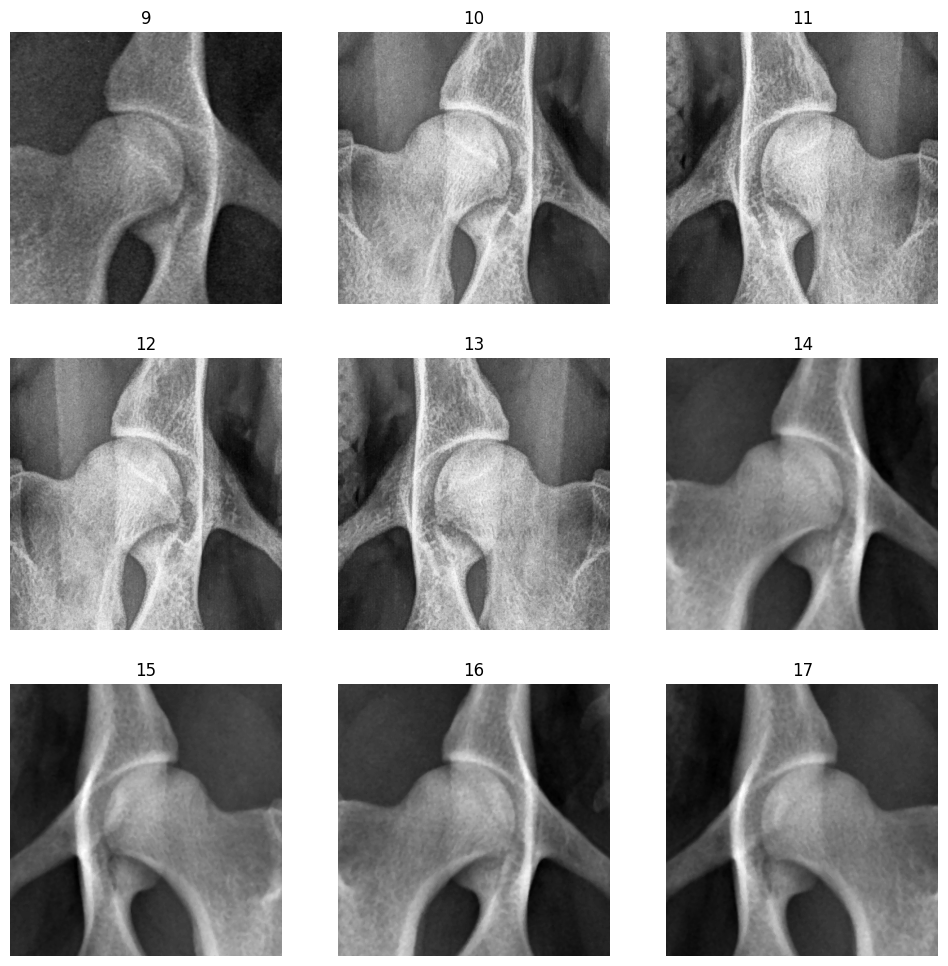

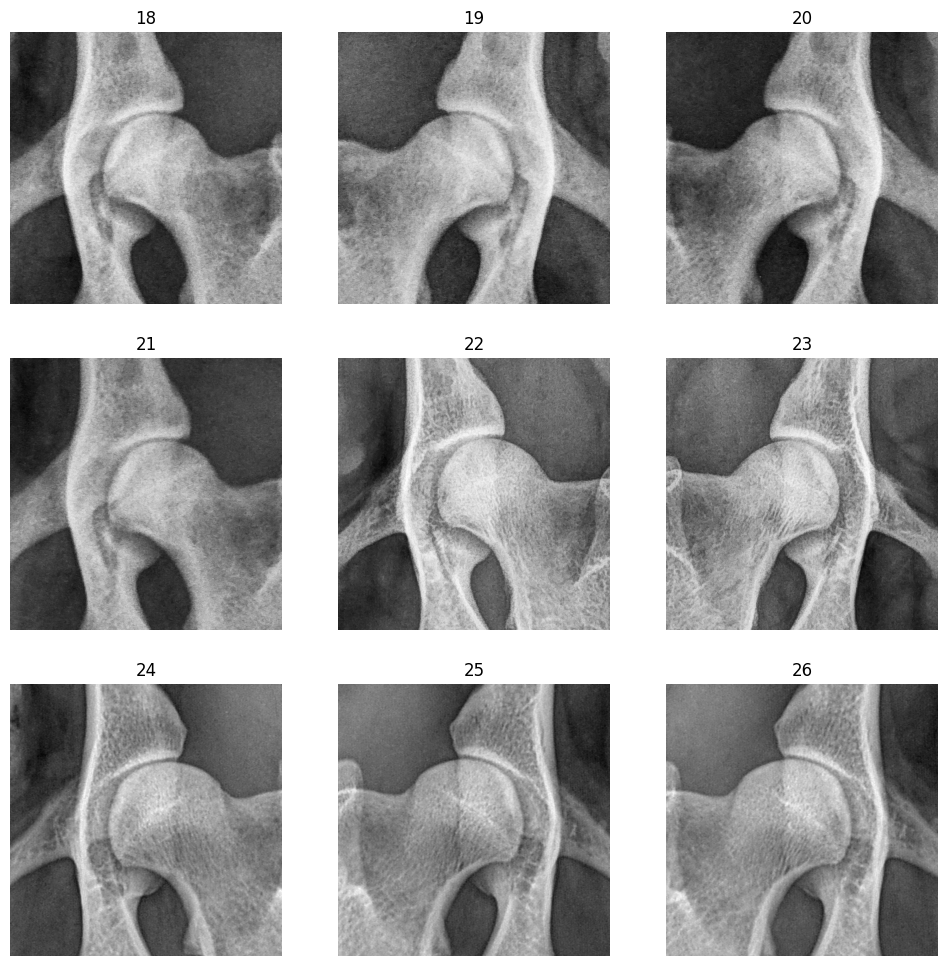

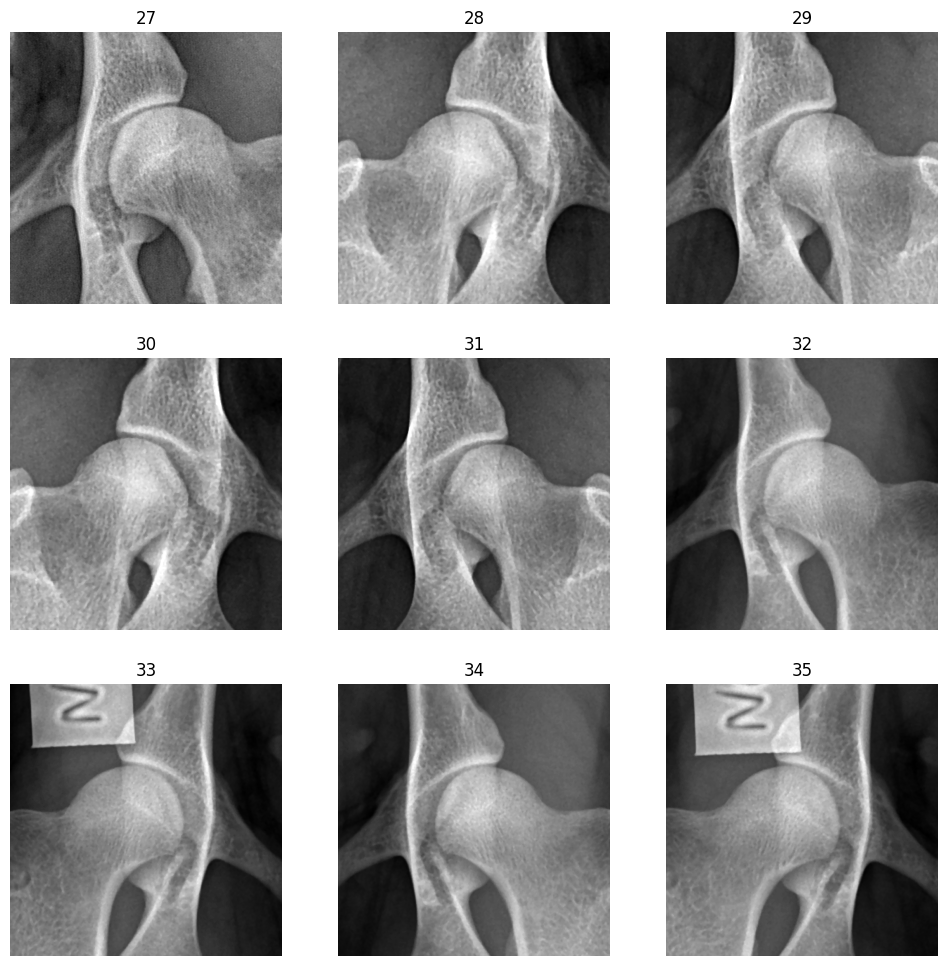

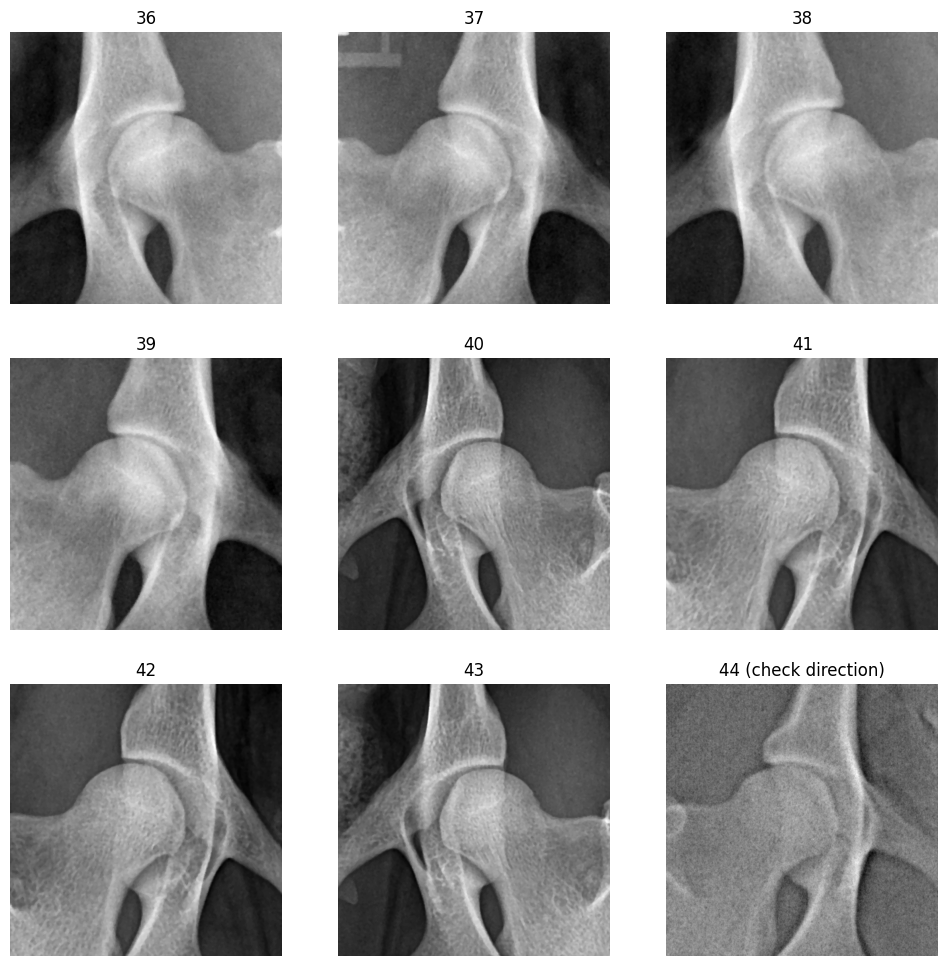

...

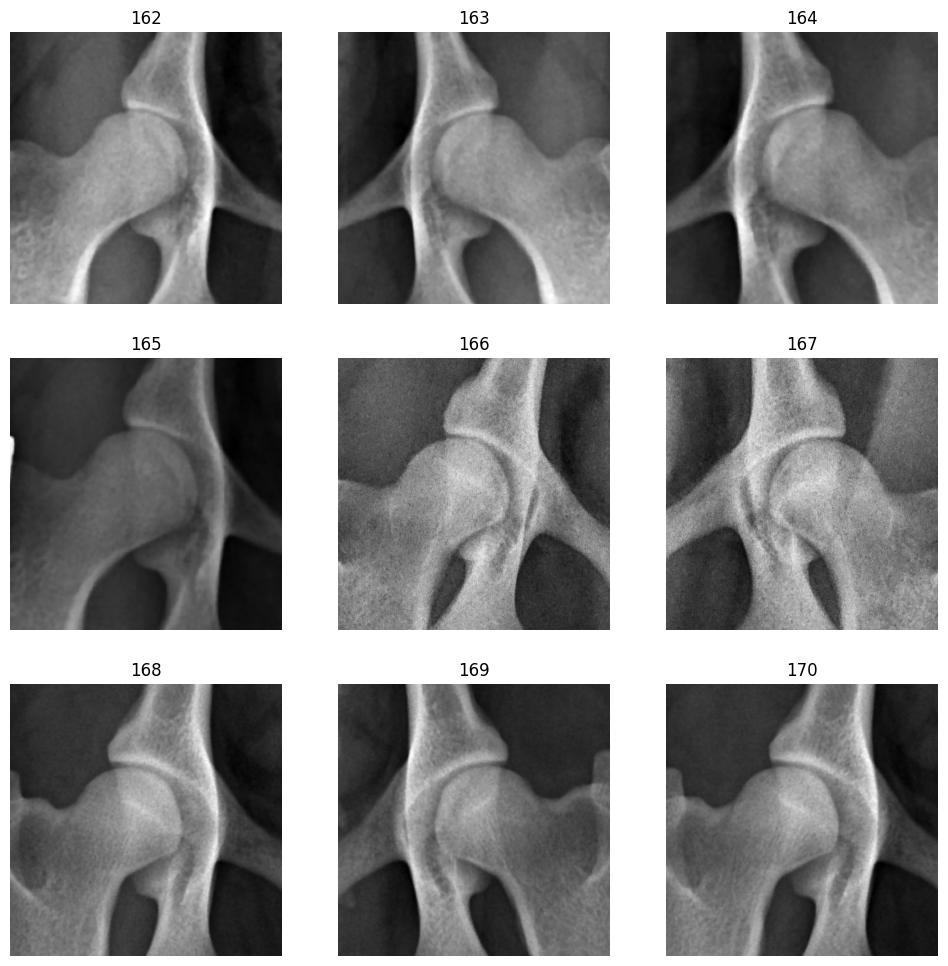

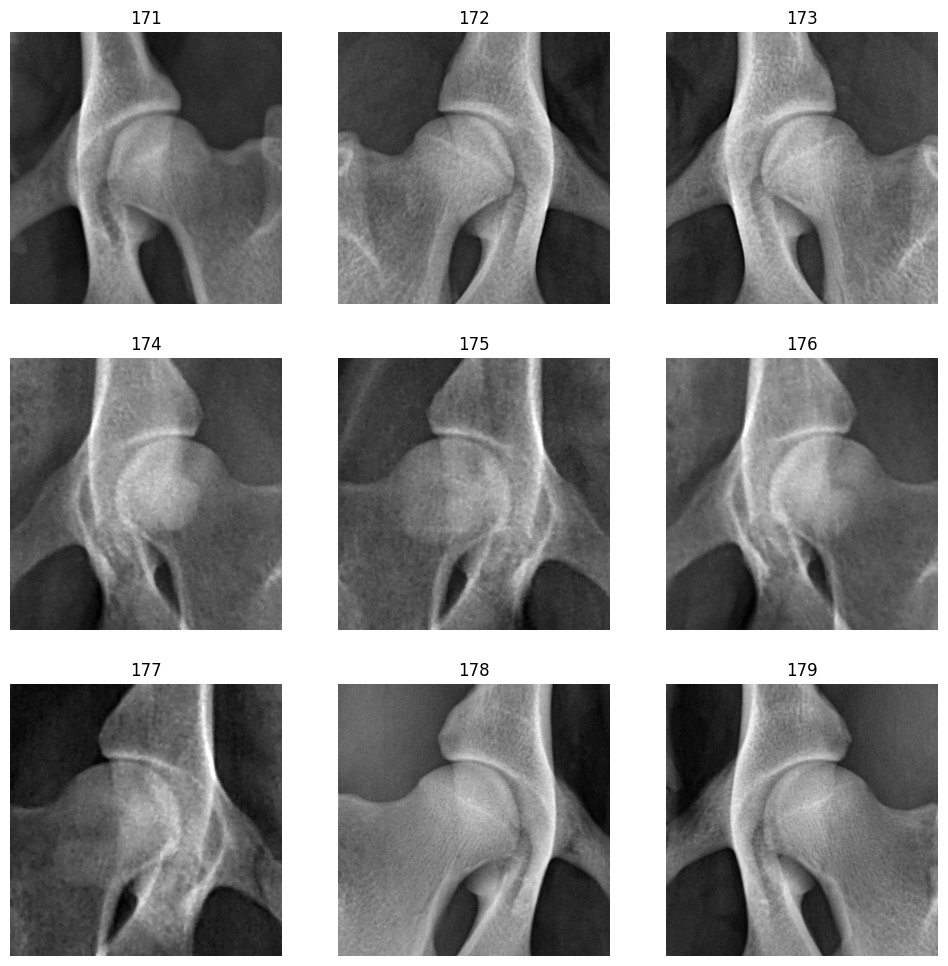

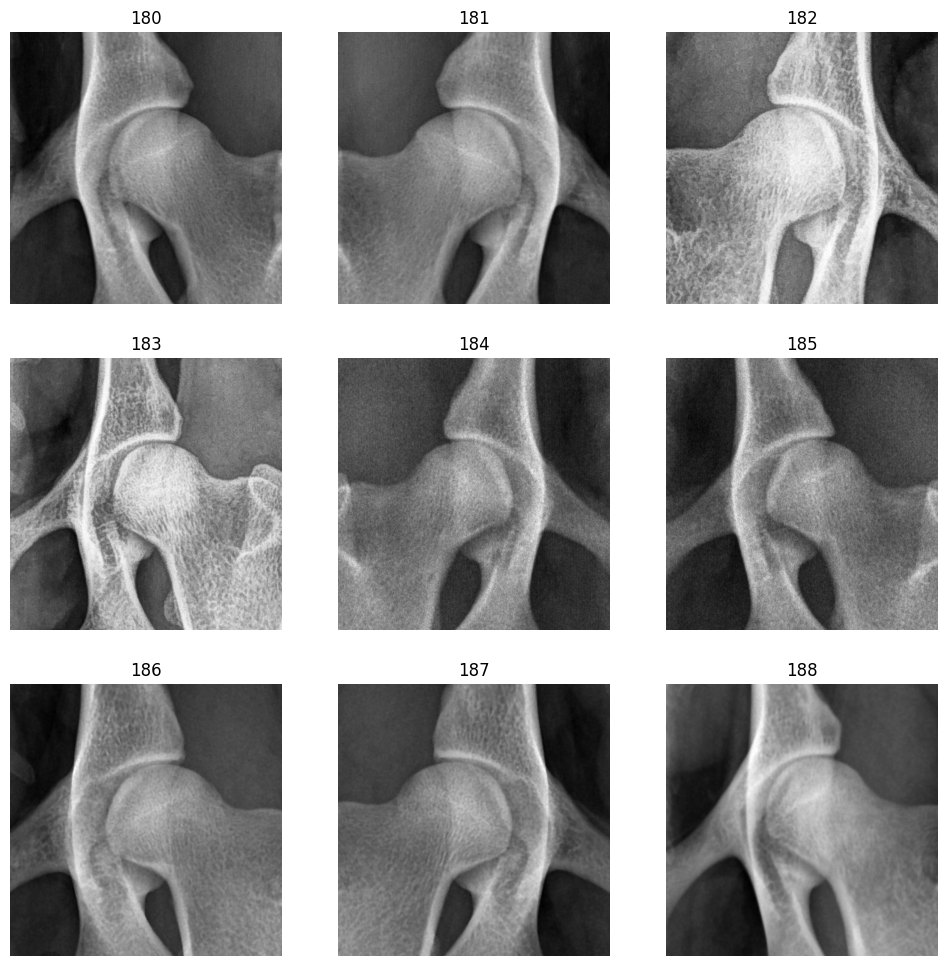

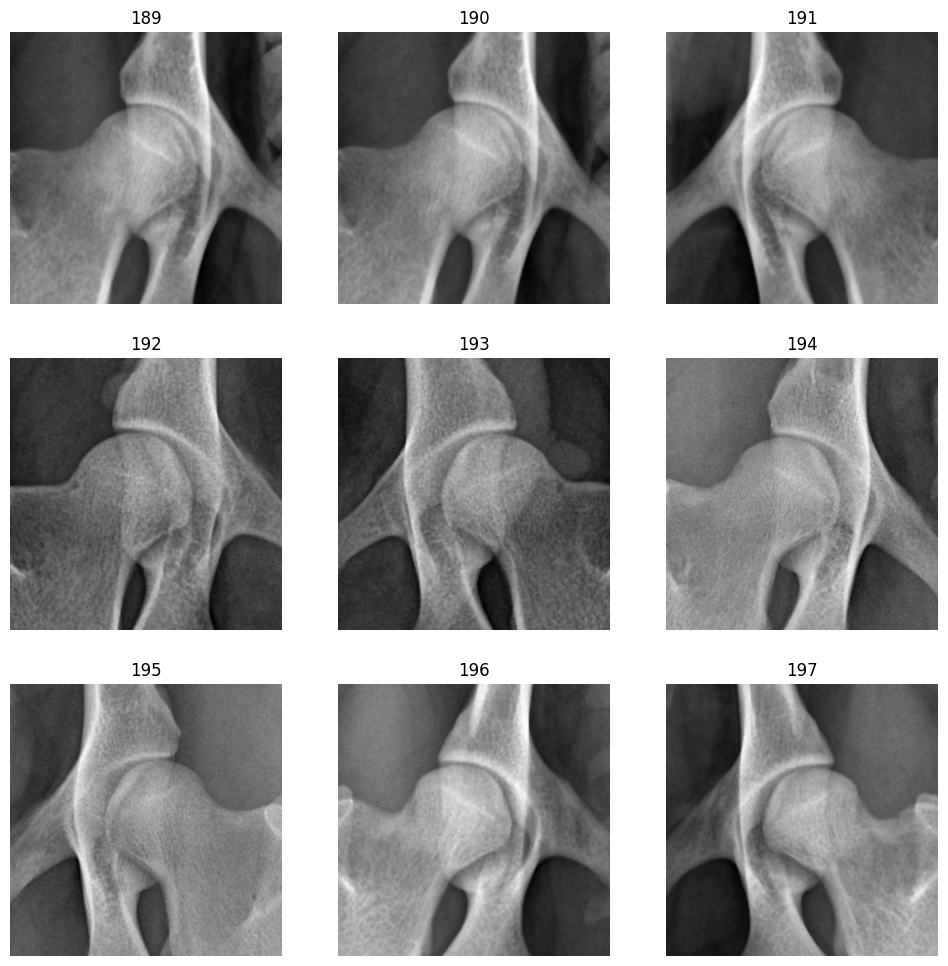

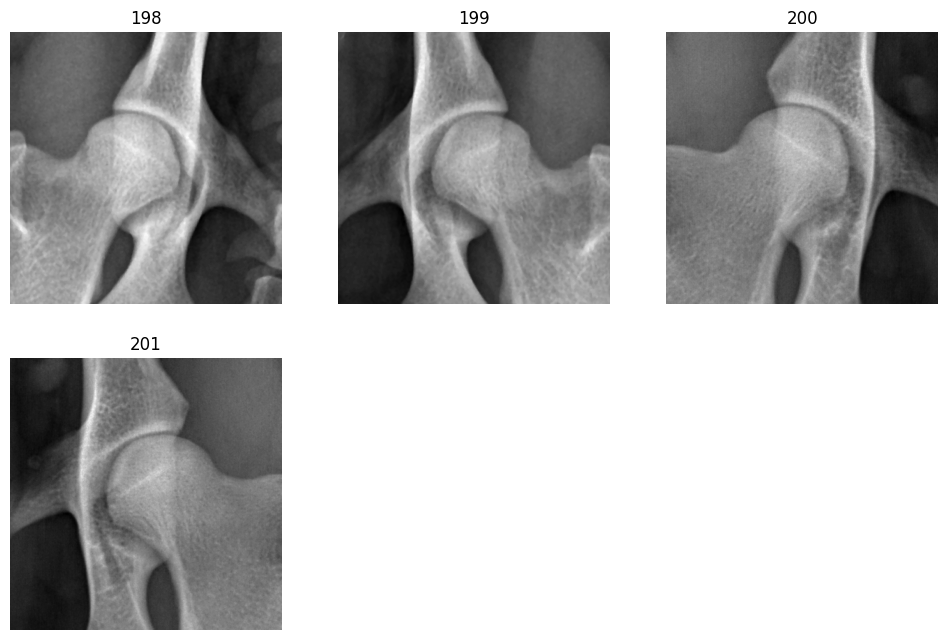

In [8]:
for id, item in detection_df.iterrows():
    fn = item['crop_name']
    img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    suffix = ' (check direction)' if item['is_rotated'] else ''
#     parent = item['parent_name']
#     if not pd.isnull(parent):
#         img = np.load(os.path.join(saved_cropped_image, parent,fn + '.npy'))
#     else:
#         img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id)+suffix)

    if (id%9) == 8:
        plt.show()                    
        
plt.show()

## Assign "flipped" column before removing failed predictions

In [9]:
flipped = np.array([False] * detection_df.shape[0])
flipped_indice = [122, 123, 124, 125]
flipped[detection_df.index.isin(flipped_indice)] = True
detection_df['flipped'] = flipped

## Remove bad detection items

In [10]:
remove_indice = []
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
0,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.32461.1.20230102.111422.0.2.12316...,1-22050834,1.2.276.0.95.32461.1.20230102.111422.0.2.12316...,838,1039,1288,1433,0.985875,False,0,AA,False
1,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.32461.1.20230102.111422.0.2.12316...,1-22050834,1.2.276.0.95.32461.1.20230102.111422.0.2.12316...,878,1079,1885,2030,0.947603,False,0,AA,False
2,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.34467.1.20230105.133125.0.2.1521.dcm,1-22056021,1.2.276.0.95.34467.1.20230105.133125.0.2.1521....,703,879,365,493,0.991792,False,0,AA,False
3,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.34467.1.20230105.133125.0.2.1521.dcm,1-22056021,1.2.276.0.95.34467.1.20230105.133125.0.2.1521....,700,883,956,1089,0.991147,False,0,AA,False
4,P:/CoxaAI/Sortering 1/AA,1.3.6.1.4.1.19179.1.1192201227148200105.3.488....,1-22098015,1.3.6.1.4.1.19179.1.1192201227148200105.3.488....,936,1079,650,752,0.996691,False,0,AA,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.15181.1.20230109.141525.0.2.2576.dcm,1-23002396,1.2.276.0.95.15181.1.20230109.141525.0.2.2576....,1137,1310,1393,1517,0.979398,False,0,AA,False
198,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.15181.1.20230109.141812.0.2.2584.dcm,1-23002396,1.2.276.0.95.15181.1.20230109.141812.0.2.2584....,1150,1328,732,859,0.996475,False,0,AA,False
199,P:/CoxaAI/Sortering 1/AA,1.2.276.0.95.15181.1.20230109.141812.0.2.2584.dcm,1-23002396,1.2.276.0.95.15181.1.20230109.141812.0.2.2584....,1175,1343,1281,1402,0.993482,False,0,AA,False
200,P:/CoxaAI/Sortering 1/AA,1.3.51.0.7.1193949500.64187.65096.46831.22406....,1-23002404,1.3.51.0.7.1193949500.64187.65096.46831.22406....,887,1061,600,725,0.976905,False,0,AA,False


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
exclude_ids = pd.read_csv('exclude_id.csv').id.values

In [13]:
new_detection_df = new_detection_df[~new_detection_df.parent_name.isin(exclude_ids)]

In [14]:
new_detection_df.to_csv(filename_clean, index=False)

In [15]:
detection_df[detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped


In [21]:
for idx in exclude_ids:
     if idx.startswith('1-22') or idx.startswith('1-23'):
            print(idx)

In [24]:
for idx in new_detection_df.parent_name:
     if idx.startswith('1-18') or idx.startswith('1-19') or idx.startswith('1-20') or idx.startswith('1-21'):
            print(idx)